In [1]:
# %pip install bezier
# %pip install networkx==2.6.2

import copy
import getopt
import math
import networkx as nx
import operator
import os
import random
import sys
from scipy import stats
import seaborn as sns
import time
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import scipy.optimize as opt

from matplotlib.collections import LineCollection
import bezier
from utils import (
    clean,
    clean_str,
    group_data,
    create_variable,
    group_time,
)
from network import (
    create_network,
    infection_yes_no,
    infection_cases,
)

%matplotlib inline

In [2]:
city_pop = pd.read_excel("MUNIC_2019.xlsx")
city_pop["NOME MUNIC"] = clean(city_pop["NOME MUNIC"])
city_pop.head(2)

,CodMun,REGIAO,COD UF,UF,NOME MUNIC,POP EST,CLASSE POP
0,1100015,1 - Norte,11,RO,ALTA FLORESTA DOESTE (RO),22945,4 - 20001 até 50000
1,1100023,1 - Norte,11,RO,ARIQUEMES (RO),107863,6 - 100001 até 500000


In [3]:
cases_bz = pd.read_csv("caso_full.csv")

cases_by_state = cases_bz[cases_bz.place_type == "state"]
cases_bz = cases_bz[cases_bz.place_type == "city"]
cases_bz.city = clean(cases_bz.city)
cases_bz["city_state"] = cases_bz.city + " (" + cases_bz.state + ")"
cases_bz.head(2)

,city,city_ibge_code,date,epidemiological_week,estimated_population,estimated_population_2019,is_last,is_repeated,last_available_confirmed,last_available_confirmed_per_100k_inhabitants,last_available_date,last_available_death_rate,last_available_deaths,order_for_place,place_type,state,new_confirmed,new_deaths,city_state
0,RIO BRANCO,1200401.0,2020-03-17,202012,413418.0,407319.0,False,False,3,0.72566,2020-03-17,0.0,0,1,city,AC,3,0,RIO BRANCO (AC)
2,RIO BRANCO,1200401.0,2020-03-18,202012,413418.0,407319.0,False,False,3,0.72566,2020-03-18,0.0,0,2,city,AC,0,0,RIO BRANCO (AC)


In [4]:
cases_by_state.head(2)

,city,city_ibge_code,date,epidemiological_week,estimated_population,estimated_population_2019,is_last,is_repeated,last_available_confirmed,last_available_confirmed_per_100k_inhabitants,last_available_date,last_available_death_rate,last_available_deaths,order_for_place,place_type,state,new_confirmed,new_deaths
1,NaN,12.0,2020-03-17,202012,894470.0,881935.0,False,False,3,0.33539,2020-03-17,0.0,0,1,state,AC,3,0
3,NaN,12.0,2020-03-18,202012,894470.0,881935.0,False,False,3,0.33539,2020-03-18,0.0,0,2,state,AC,0,0


In [5]:
epi_week = cases_bz[["date", "epidemiological_week"]].drop_duplicates()
print(len(epi_week), "epidemiological weeks")
epi_week.tail(2)

692 epidemiological weeks


,date,epidemiological_week
2970939,2020-03-03,202010
2970941,2020-03-04,202010


In [6]:
cases_bz = pd.merge(
    left=cases_bz,
    right=city_pop,
    how="left",
    left_on="city_state",
    right_on="NOME MUNIC",
)
cases_bz.head(2)

,city,city_ibge_code,date,epidemiological_week,estimated_population,estimated_population_2019,is_last,is_repeated,last_available_confirmed,last_available_confirmed_per_100k_inhabitants,...,new_confirmed,new_deaths,city_state,CodMun,REGIAO,COD UF,UF,NOME MUNIC,POP EST,CLASSE POP
0,RIO BRANCO,1200401.0,2020-03-17,202012,413418.0,407319.0,False,False,3,0.72566,...,3,0,RIO BRANCO (AC),1200401.0,1 - Norte,12.0,AC,RIO BRANCO (AC),407319.0,6 - 100001 até 500000
1,RIO BRANCO,1200401.0,2020-03-18,202012,413418.0,407319.0,False,False,3,0.72566,...,0,0,RIO BRANCO (AC),1200401.0,1 - Norte,12.0,AC,RIO BRANCO (AC),407319.0,6 - 100001 até 500000


In [7]:
grouped_by_state = group_data(cases_by_state, ["state", "epidemiological_week"])
grouped_by_state = create_variable(grouped_by_state, "state", -0.01, 0.10)
grouped_by_state.head(2)

,state,epidemiological_week,last_available_confirmed,last_available_confirmed_per_100k_inhabitants,new_confirmed,last_available_deaths,new_deaths,estimated_population,confirmed_percent,new_confirmed_percent_pop,new_deaths_percent,new_confirmed_percent,decrease_deaths,stability_deaths,increase_deaths,decrease_cases,stability_cases,increase_cases,last_week_confirmed,last_week_new_confirmed
0,AC,202012,28,0.626068,11,0,0,894470.0,0.000031,0.000012,NaN,NaN,False,False,False,False,False,False,NaN,NaN
1,AC,202013,145,2.315819,14,0,0,894470.0,0.000162,0.000016,NaN,0.272727,False,False,False,False,False,True,28.0,11.0


In [8]:
grouped_by_city = group_data(cases_bz, ["city_state", "epidemiological_week"])
grouped_by_city = create_variable(grouped_by_city, "city_state", -0.01, 0.10)
grouped_by_city.head(2)

,city_state,epidemiological_week,last_available_confirmed,last_available_confirmed_per_100k_inhabitants,new_confirmed,last_available_deaths,new_deaths,estimated_population,confirmed_percent,new_confirmed_percent_pop,new_deaths_percent,new_confirmed_percent,decrease_deaths,stability_deaths,increase_deaths,decrease_cases,stability_cases,increase_cases,last_week_confirmed,last_week_new_confirmed
0,ABADIA DE GOIAS (GO),202021,16,59.537100,5,0,0,8958.0,0.001786,0.000558,NaN,NaN,False,False,False,False,False,False,NaN,NaN
1,ABADIA DE GOIAS (GO),202022,41,65.384496,1,0,0,8958.0,0.004577,0.000112,NaN,-0.8,False,False,False,True,False,False,16.0,5.0


In [9]:
grouped_by_city_per_epi_week = group_time(
    grouped_by_city, "epidemiological_week", "city_state"
)
grouped_by_city_per_epi_week.head()

,city_state,decrease_deaths,stability_deaths,increase_deaths,decrease_cases,stability_cases,increase_cases,decrease_deaths_percent,stability_deaths_percent,increase_deaths_percent,decrease_cases_percent,stability_cases_percent,increase_cases_percent
epidemiological_week,,,,,,,,,,,,,
202009,1,1,0,0,1,0,0,1.000000,0.0,0.000000,1.000000,0.000000,0.000000
202010,6,6,0,0,5,0,1,1.000000,0.0,0.000000,0.833333,0.000000,0.166667
202011,31,31,0,0,27,1,3,1.000000,0.0,0.000000,0.870968,0.032258,0.096774
202012,142,142,0,0,118,5,19,1.000000,0.0,0.000000,0.830986,0.035211,0.133803
202013,313,312,0,1,230,18,65,0.996805,0.0,0.003195,0.734824,0.057508,0.207668


In [10]:
grouped_by_state_per_epi_week = group_time(
    grouped_by_state, "epidemiological_week", "state"
)
grouped_by_state_per_epi_week.head()

,state,decrease_deaths,stability_deaths,increase_deaths,decrease_cases,stability_cases,increase_cases,decrease_deaths_percent,stability_deaths_percent,increase_deaths_percent,decrease_cases_percent,stability_cases_percent,increase_cases_percent
epidemiological_week,,,,,,,,,,,,,
202009,1,1,0,0,1,0,0,1.000000,0.0,0.000000,1.000000,0.000000,0.000000
202010,5,5,0,0,4,0,1,1.000000,0.0,0.000000,0.800000,0.000000,0.200000
202011,17,17,0,0,12,0,5,1.000000,0.0,0.000000,0.705882,0.000000,0.294118
202012,27,26,0,0,10,0,16,0.962963,0.0,0.000000,0.370370,0.000000,0.592593
202013,27,24,0,2,1,2,24,0.888889,0.0,0.074074,0.037037,0.074074,0.888889


Text(0.5, 1.0, 'Change in # of Deaths: States of Brazil')

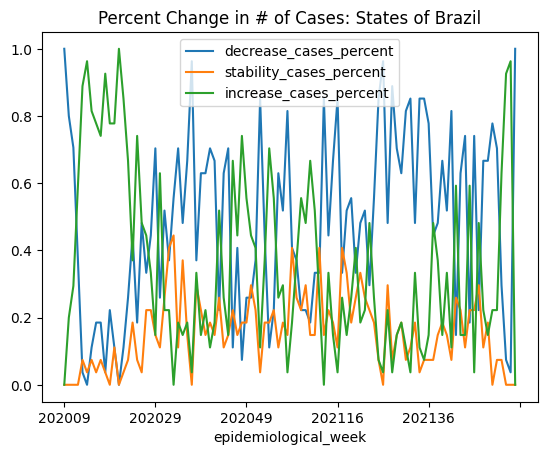

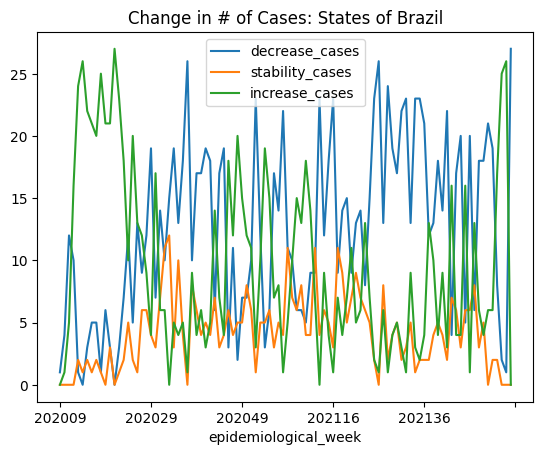

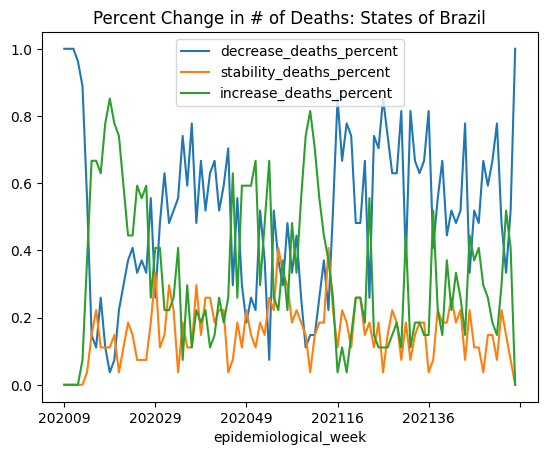

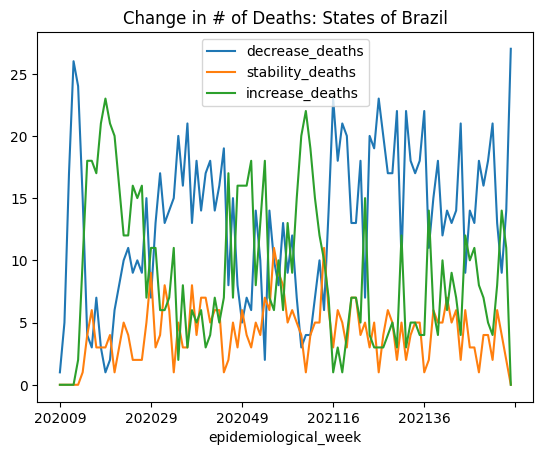

In [11]:
grouped_by_state_per_epi_week.index = grouped_by_state_per_epi_week.index.map(str)
grouped_by_state_per_epi_week[
    ["decrease_cases_percent", "stability_cases_percent", "increase_cases_percent"]
].plot()
plt.title("Percent Change in # of Cases: States of Brazil")
grouped_by_state_per_epi_week[
    ["decrease_cases", "stability_cases", "increase_cases"]
].plot()
plt.title("Change in # of Cases: States of Brazil")

grouped_by_state_per_epi_week[
    ["decrease_deaths_percent", "stability_deaths_percent", "increase_deaths_percent"]
].plot()
plt.title("Percent Change in # of Deaths: States of Brazil")
grouped_by_state_per_epi_week[
    ["decrease_deaths", "stability_deaths", "increase_deaths"]
].plot()
plt.title("Change in # of Deaths: States of Brazil")

Text(0.5, 1.0, 'Change in # of Deaths: Cities of Brazil')

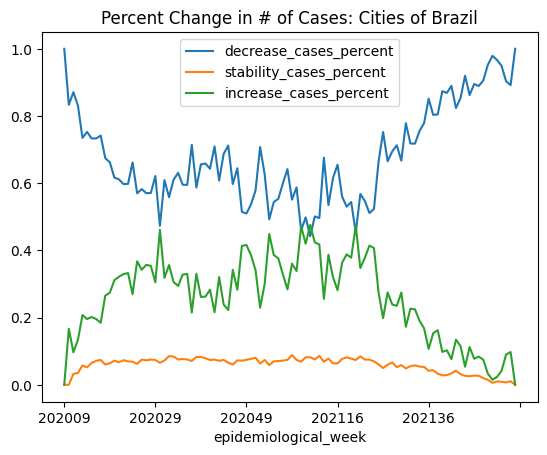

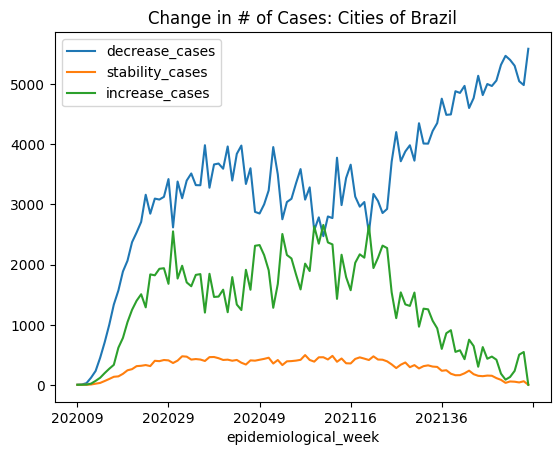

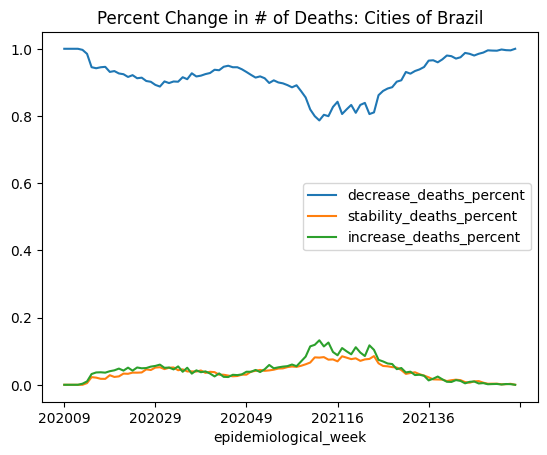

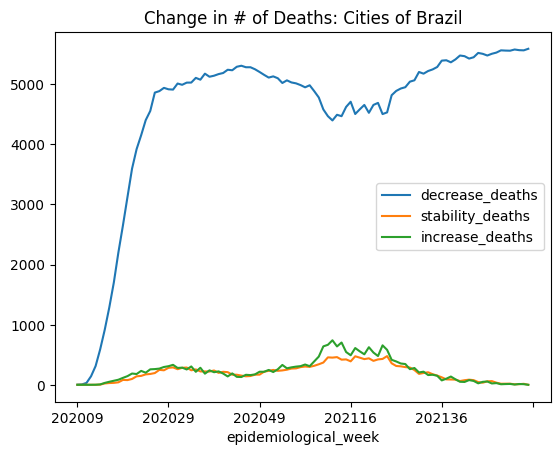

In [12]:
grouped_by_city_per_epi_week.index = grouped_by_city_per_epi_week.index.map(str)
grouped_by_city_per_epi_week[
    ["decrease_cases_percent", "stability_cases_percent", "increase_cases_percent"]
].plot()
plt.title("Percent Change in # of Cases: Cities of Brazil")
grouped_by_city_per_epi_week[
    ["decrease_cases", "stability_cases", "increase_cases"]
].plot()
plt.title("Change in # of Cases: Cities of Brazil")

grouped_by_city_per_epi_week.index = grouped_by_city_per_epi_week.index.map(str)
grouped_by_city_per_epi_week[
    ["decrease_deaths_percent", "stability_deaths_percent", "increase_deaths_percent"]
].plot()
plt.title("Percent Change in # of Deaths: Cities of Brazil")
grouped_by_city_per_epi_week[
    ["decrease_deaths", "stability_deaths", "increase_deaths"]
].plot()
plt.title("Change in # of Deaths: Cities of Brazil")

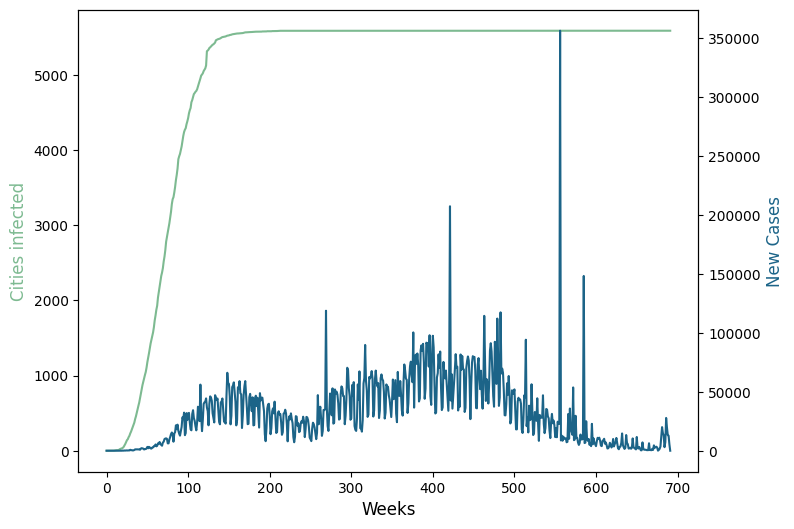

In [13]:
aggDf = (
    cases_bz.groupby("date")
    .agg({"city_state": "count", "new_confirmed": "sum", "new_deaths": "sum"})
    .reset_index()
)
aggDf.date = pd.to_datetime(aggDf.date)
aggDf = aggDf.set_index("date")
aggWeekDf = aggDf.resample("W").sum()

x = np.array(range(0, len(aggDf.reset_index().date.tolist())))
y_num = np.array(aggDf.reset_index().city_state.tolist())
y_cases = np.array(aggDf.reset_index().new_confirmed.tolist())
y_deaths = np.array(aggDf.reset_index().new_deaths.tolist())
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax2 = ax.twinx()
ax.plot(x, y_num, "-", color=(0.48942421, 0.72854938, 0.56751036))
ax2.plot(x, y_cases, "-", color=(0.11131735, 0.39155635, 0.53422678))
ax2.set_ylabel("New Cases", fontsize=12, color=(0.11131735, 0.39155635, 0.53422678))
ax.set_xlabel("Weeks", fontsize=12)
ax.set_ylabel(
    "Cities infected", fontsize=12, color=(0.48942421, 0.72854938, 0.56751036)
)
plt.show()

In [16]:
aggregated_df = (
    cases_bz.groupby("epidemiological_week")
    .agg({"city_state": "nunique", "new_confirmed": "sum", "new_deaths": "sum"})
    .reset_index()
)

In [17]:
aggregated_df["susceptible"] = 5589 - aggDf.city_state
aggregated_df.head(10)

,epidemiological_week,city_state,new_confirmed,new_deaths,susceptible
0,202009,1,2,0,NaN
1,202010,6,16,0,NaN
2,202011,31,114,0,NaN
3,202012,142,939,12,NaN
4,202013,313,2655,86,NaN
5,202014,598,6616,345,NaN
6,202015,967,10650,698,NaN
7,202016,1364,16181,1234,NaN
8,202017,1800,22333,1699,NaN
9,202018,2326,38073,2736,NaN


In [18]:
G = create_network("grafo_cidades_aeroportos.gexf")
G.remove_edges_from(nx.selfloop_edges(G))

Creating network.
	Calculating edge weights				[Done]
	Calculating edge distance				[Done]
	Calculating clustering coefficents			[Done]


Replicating infection.
202009, 0.9998204345483929, 0.0001795654516071108
-- Starting to Visualize --


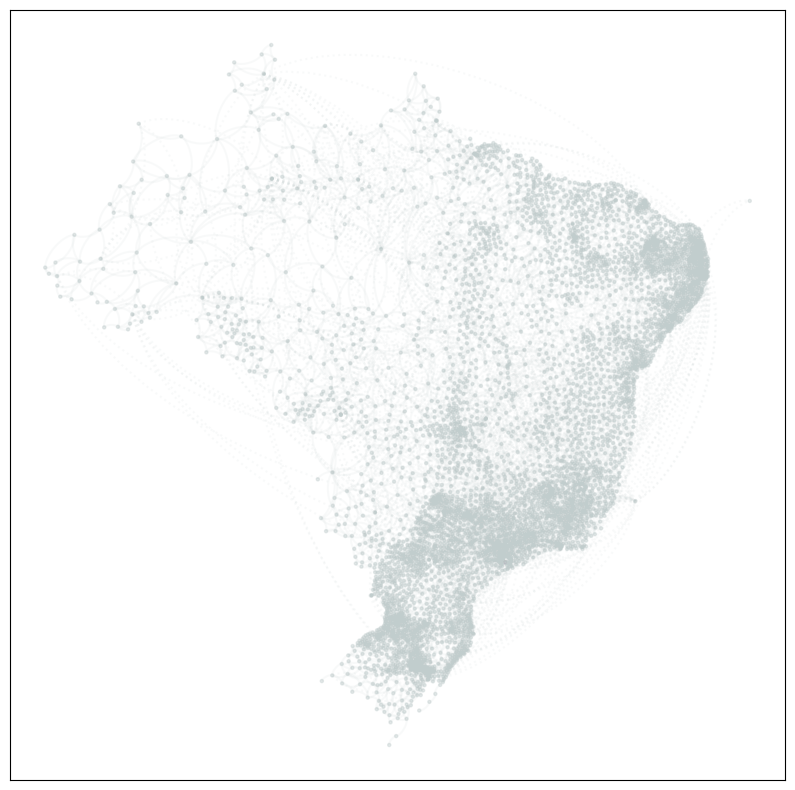

202010, 0.9989226072903573, 0.0010773927096426647
-- Starting to Visualize --


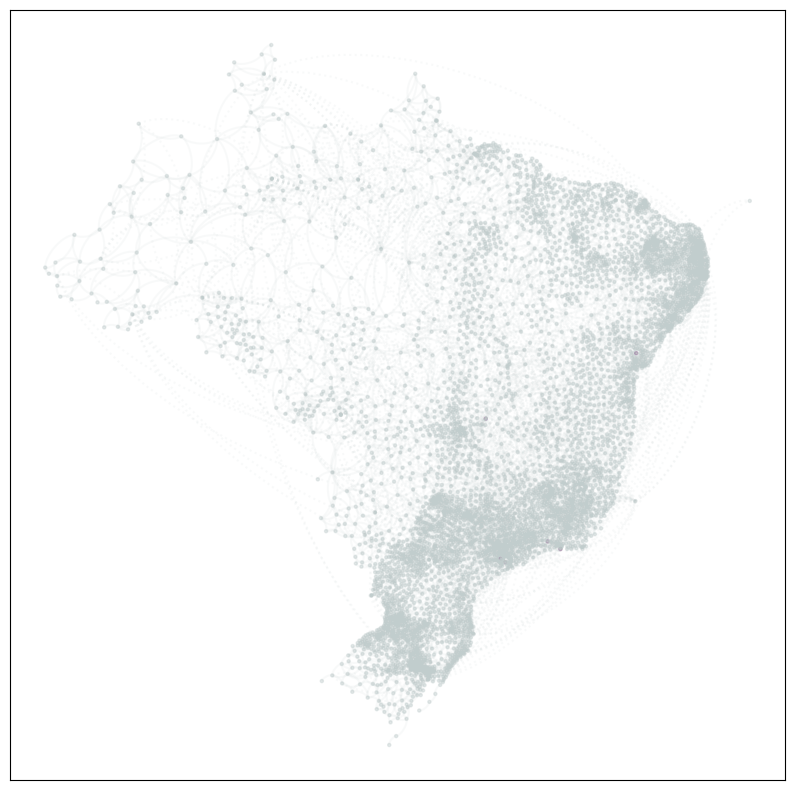

202011, 0.9946130364517867, 0.0053869635482133235
-- Starting to Visualize --


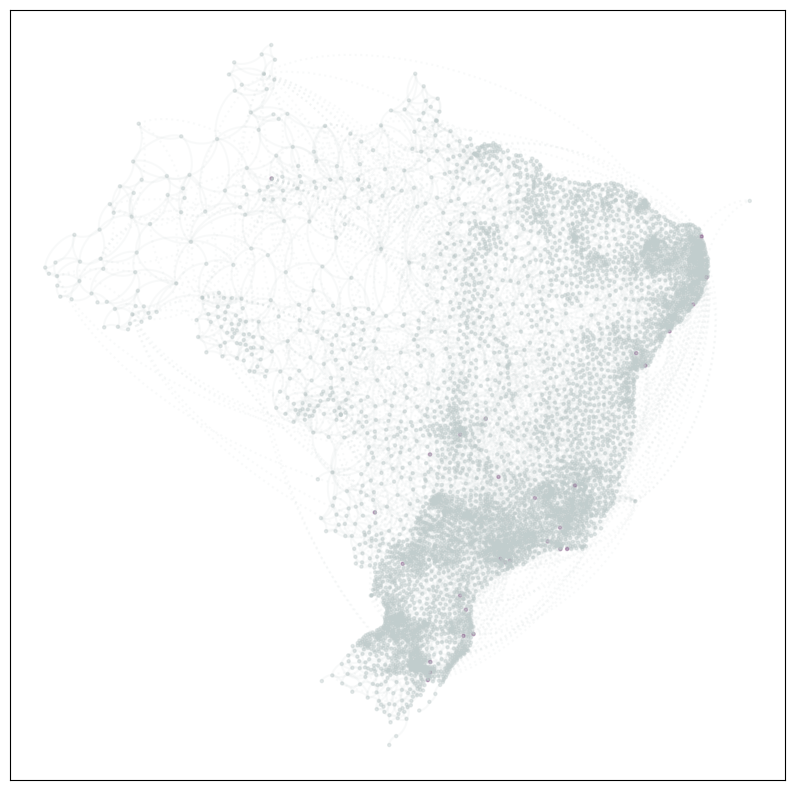

202012, 0.9755790985814329, 0.024420901418567068
-- Starting to Visualize --


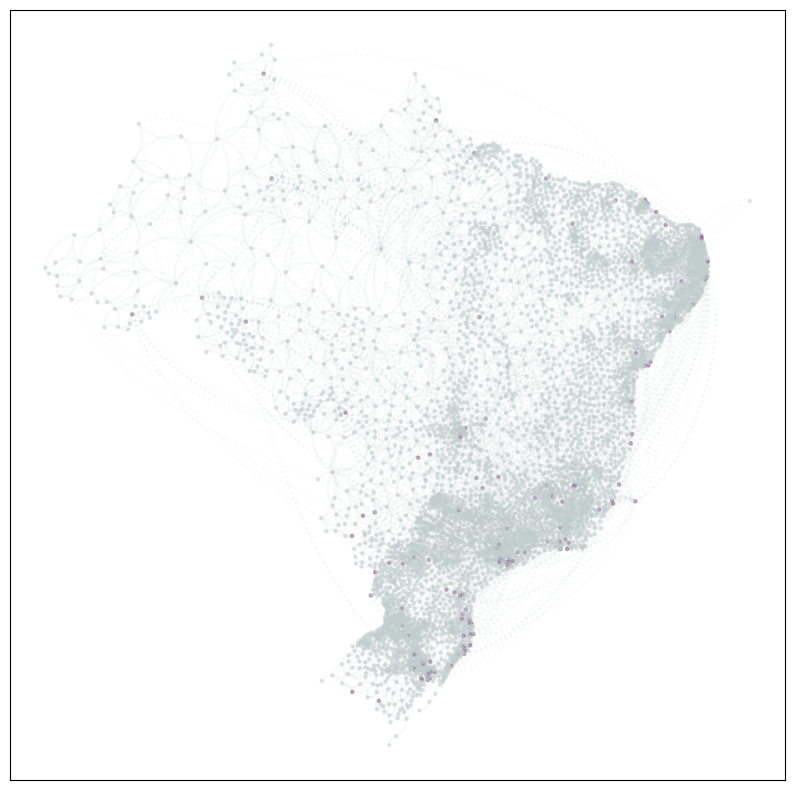

202013, 0.9459507990662597, 0.05404920093374035
-- Starting to Visualize --


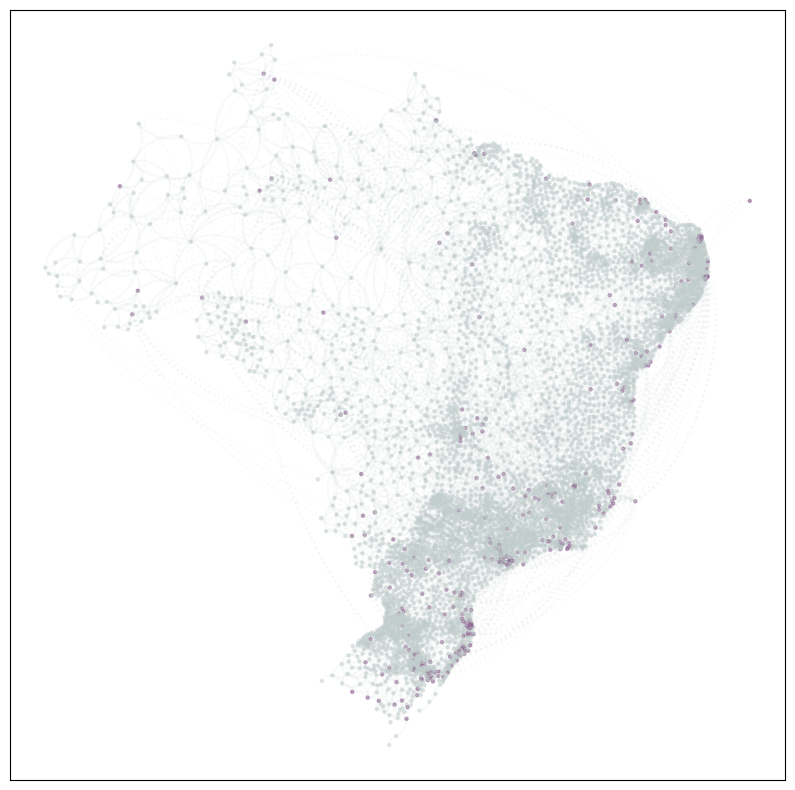

202014, 0.8949542108098402, 0.10504578919015982
-- Starting to Visualize --


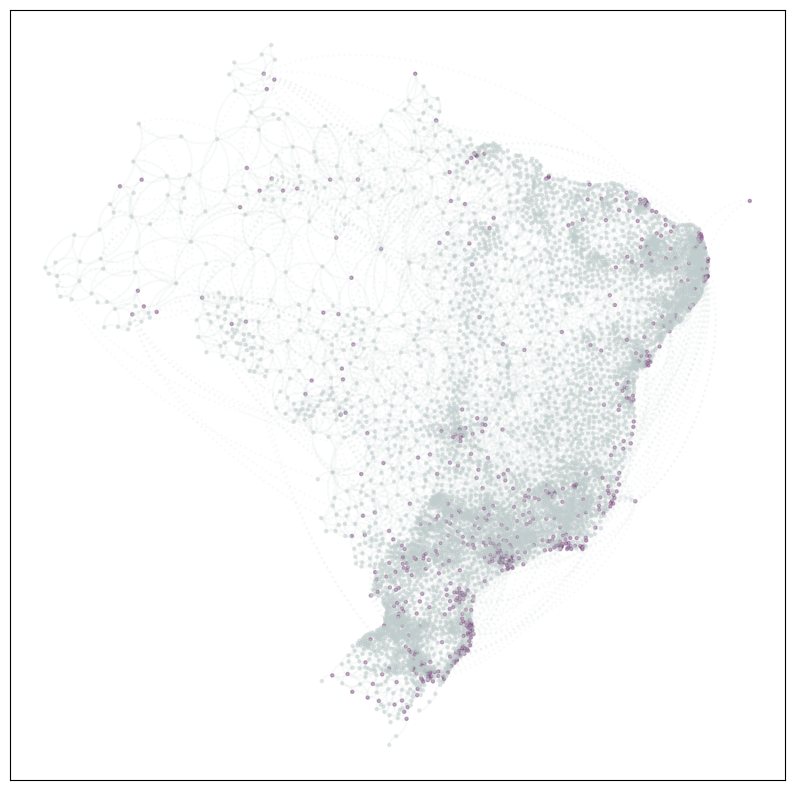

202015, 0.8290536900700305, 0.17094630992996948
-- Starting to Visualize --


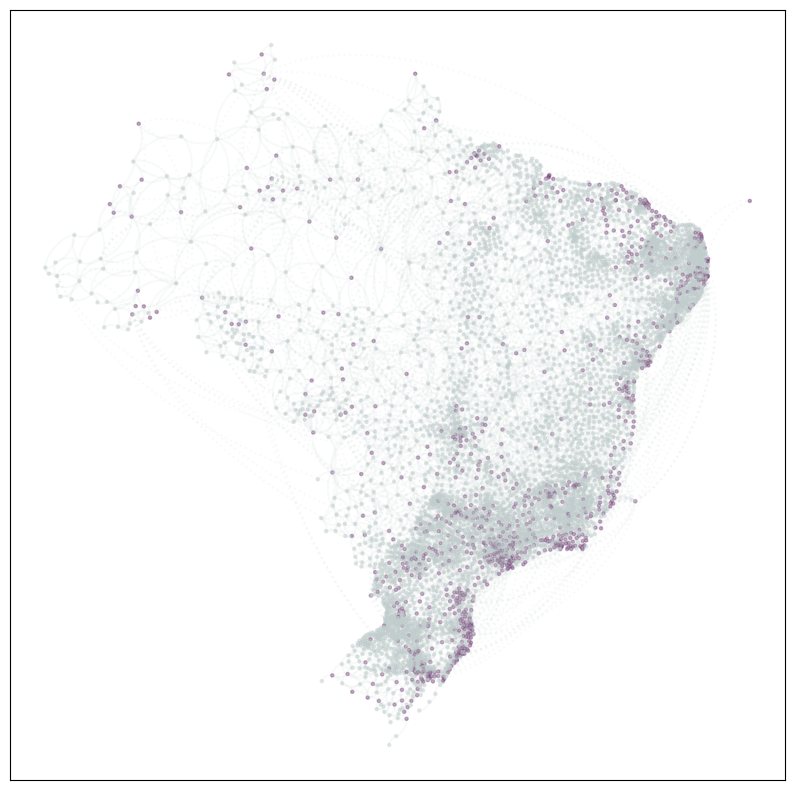

202016, 0.7579457712336146, 0.24205422876638535
-- Starting to Visualize --


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ /Users/giovanna_cavali/opt/anaconda3/envs/c1w_rb/lib/python3.8/site-packages/PIL/ImageFile.py:51 │
│ 8 in _save                                                                                       │
│                                                                                                  │
│   515 │   # a tricky case.                                                                       │
│   516 │   bufsize = max(MAXBLOCK, bufsize, im.size[0] * 4)  # see RawEncode.c                    │
│   517 │   try:                                                                                   │
│ ❱ 518 │   │   fh = fp.fileno()                                                                   │
│   519 │   │   fp.flush()                                                                         │
│   520 │   │   _encode_tile(im, fp, tile, bufsize, fh)                                            │
│   521 │   except (AttributeError, io.UnsupportedOperation) as exc:                               │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
AttributeError: '_idat' object has no attribute 'fileno'

During handling of the above exception, another exception occurred:

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:1                                                                                    │
│                                                                                                  │
│ ❱ 1 infection_yes_no(                                                                            │
│   2 │   G,                                                                                       │
│   3 │   grouped_by_city,                                                                         │
│   4 │   vis=True,                                                                                │
│                                                                                                  │
│ /Users/giovanna_cavali/gcavali-repo/network.py:352 in infection_yes_no                           │
│                                                                                                  │
│   349 │   │   │   break                                                                          │
│   350 │   │                                                                                      │
│   351 │   │   if vis:                                                                            │
│ ❱ 352 │   │   │   visualize_curved_edges(network, title, pos, curves)                            │
│   353 │                                                                                          │
│   354 │   print(                                                                                 │
│   355 │   │   "\t----------\n\tS: {0}, I: {1}, {2}".format(                                      │
│                                                                                                  │
│ /Users/giovanna_cavali/gcavali-repo/network.py:290 in visualize_curved_edges                     │
│                                                                                                  │
│   287 │   number_files = str(len(os.listdir()))                                                  │
│   288 │   while len(number_files) < 3:                                                           │
│   289 │   │   number_files = "0" + number_files                                                  │
│ ❱ 290 │   plt.savefig(                                                                           │
│   291 │   │   "infection_real-{0}.png".format(number_files), bbox_inches="tight", dpi=600        │
│   292 │   )                                                                                      │
│   293 │   plt.show()             

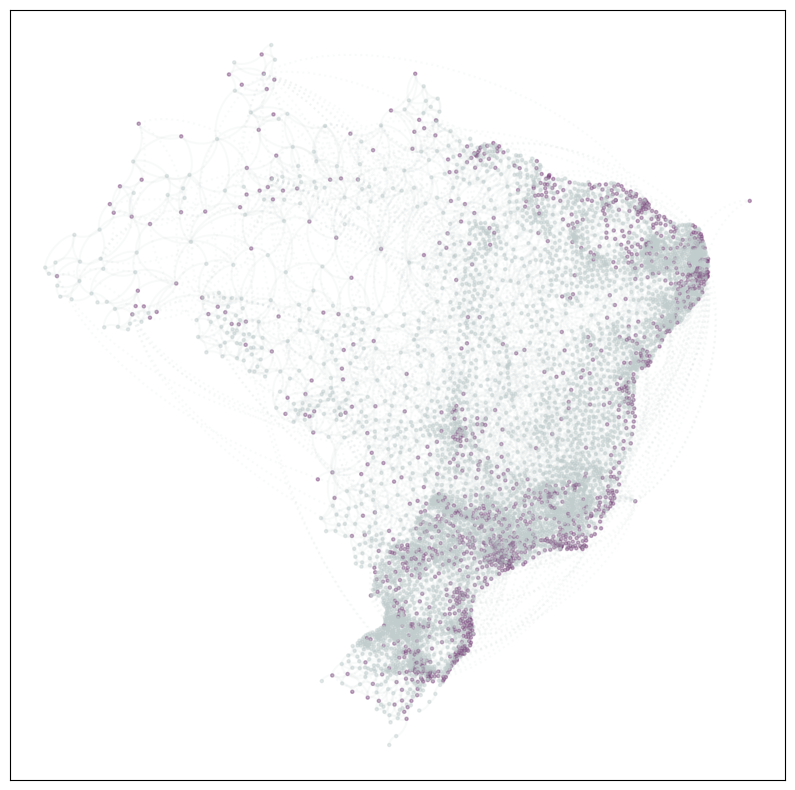

In [19]:
infection_yes_no(
    G,
    grouped_by_city,
    vis=True,
    title="title",
)

In [25]:
G = create_network("grafo_cidades_aeroportos.gexf")
infection_cases(
    G,
    grouped_by_city,
    vis=True,
    title="title",
)

Creating network.
	Calculating edge weights				[Done]
	Calculating edge distance				[Done]
	Calculating clustering coefficents			[Done]
Replicating infection.


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:2                                                                                    │
│                                                                                                  │
│   1 G = create_network("grafo_cidades_aeroportos.gexf")                                          │
│ ❱ 2 infection_cases(                                                                             │
│   3 │   G,                                                                                       │
│   4 │   grouped_by_city,                                                                         │
│   5 │   vis=True,                                                                                │
│                                                                                                  │
│ /Users/giovanna_cavali/gcavali-repo/network.py:346 in infection_cases                            │
│                                                                                                  │
│   343 │                                                                                          │
│   344 │   network = input_network.copy()                                                         │
│   345 │   positions = nx.get_node_attributes(network, "pos")                                     │
│ ❱ 346 │   curves = curved_edges(network, positions)                                              │
│   347 │                                                                                          │
│   348 │   # Set the default to susceptable                                                       │
│   349 │   sys.stdout.flush()                                                                     │
│                                                                                                  │
│ /Users/giovanna_cavali/gcavali-repo/network.py:207 in curved_edges                               │
│                                                                                                  │
│   204 │   for i in range(l):                                                                     │
│   205 │   │   nodes = node_matrix[:, i, :].T                                                     │
│   206 │   │   curveplots.append(                                                                 │
│ ❱ 207 │   │   │   bezier.Curve(nodes, degree=2)                                                  │
│   208 │   │   │   .evaluate_multi(np.linspace(0, 1, bezier_precision))                           │
│   209 │   │   │   .T                                                                             │
│   210 │   │   )                                                                                  │
│                                                                                                  │
│ /Users/giovanna_cavali/opt/anaconda3/envs/c1w_rb/lib/python3.8/site-packages/bezier/curve.py:101 │
│ in __init__                                                                                      │
│                                                                                                  │
│    98 │   def __init__(self, nodes, degree, *, copy=True, verify=True):                          │
│    99 │   │   super().__init__(nodes, copy=copy)                                                 │
│   100 │   │   self._degree = degree                                                              │
│ ❱ 101 │   │   self._verify_degree(verify)                                                        │
│   102 │                                                                                          │
│   103 │   @classmethod                                                                           │
│   104 │   def from_nodes(cls, nodes, copy=True):                                                 │
│                                                            

In [21]:
grouped_by_city["state"] = grouped_by_city.city_state.str.get(
    -3
) + grouped_by_city.city_state.str.get(-2)

Creating network.
	Calculating edge weights				[Done]
	Calculating edge distance				[Done]
	Calculating clustering coefficents			[Done]
Replicating infection.
202009, 0.9984472049689441, 0.0015527950310559005
-- Starting to Visualize --


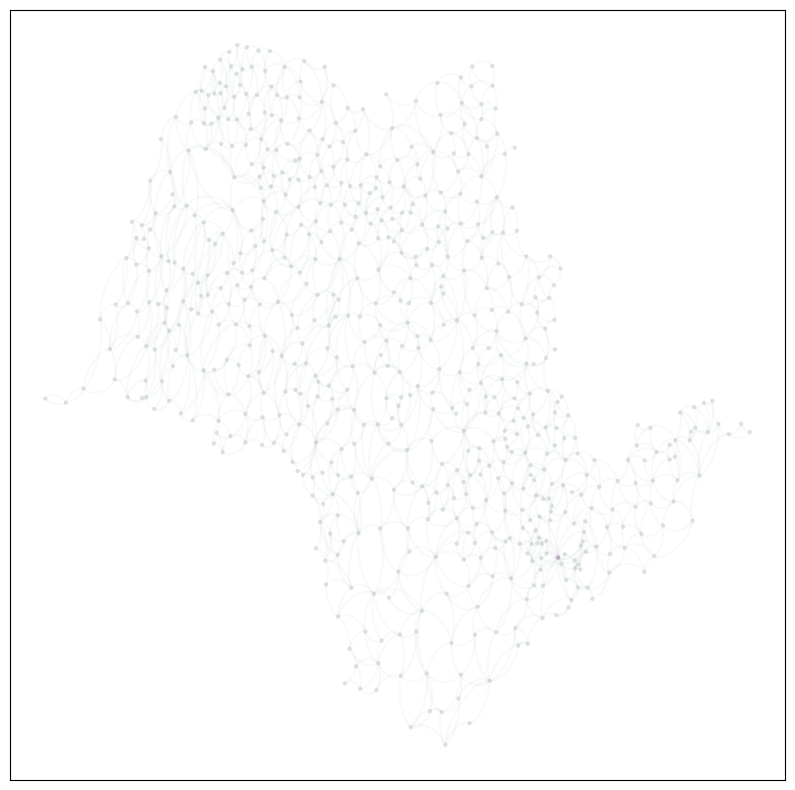

202010, 0.9968944099378882, 0.003105590062111801
-- Starting to Visualize --


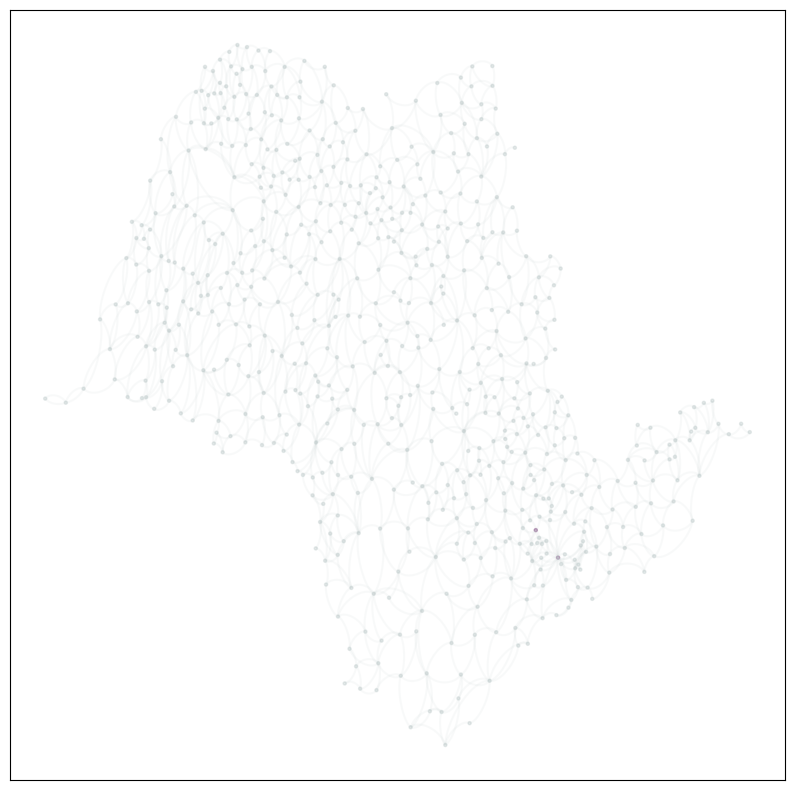

202011, 0.9937888198757764, 0.006211180124223602
-- Starting to Visualize --


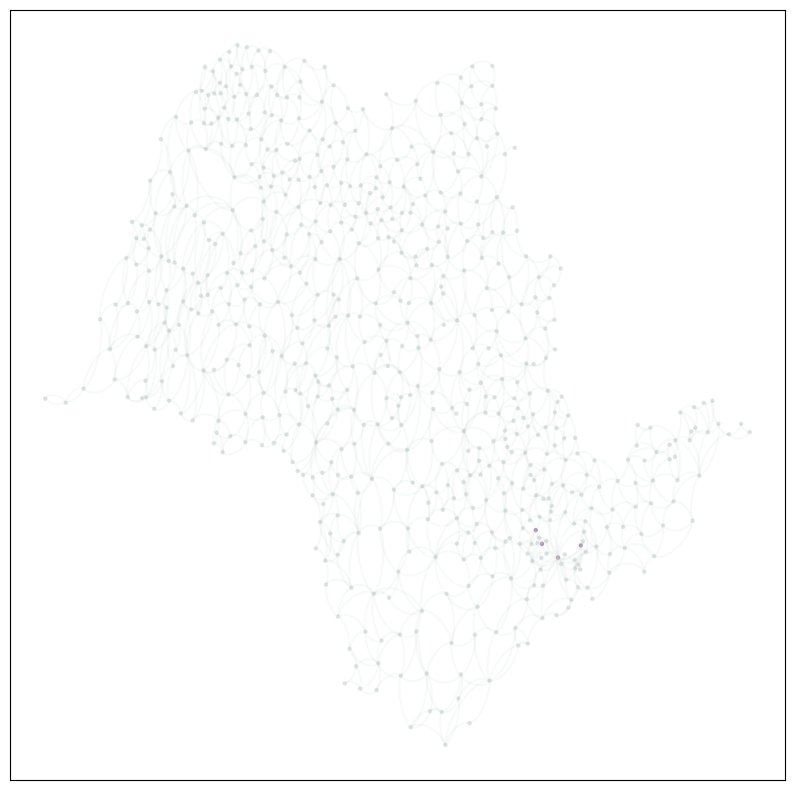

202012, 0.967391304347826, 0.03260869565217391
-- Starting to Visualize --


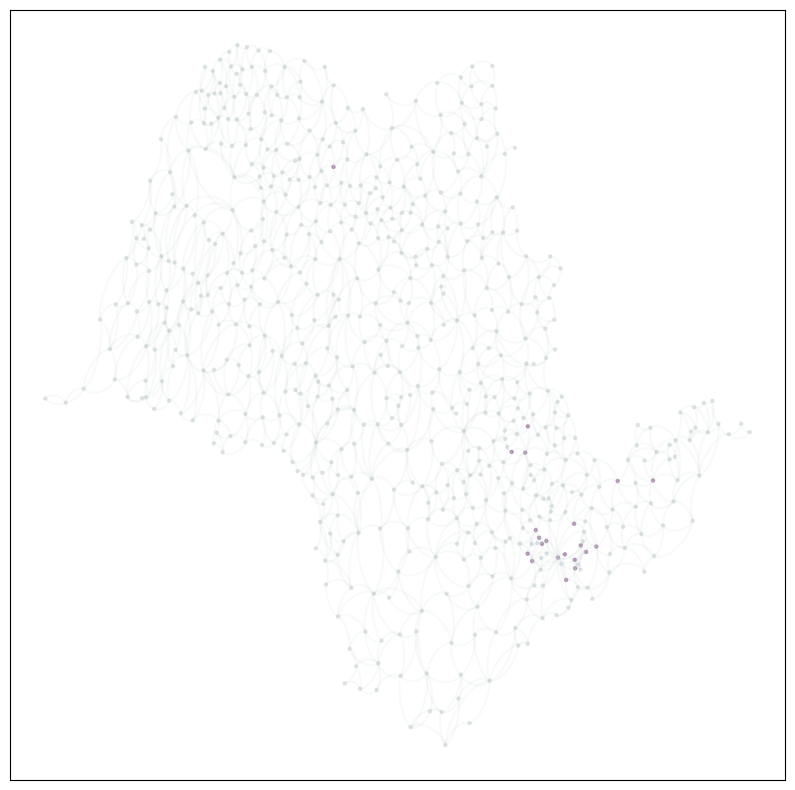

202013, 0.9409937888198758, 0.059006211180124224
-- Starting to Visualize --


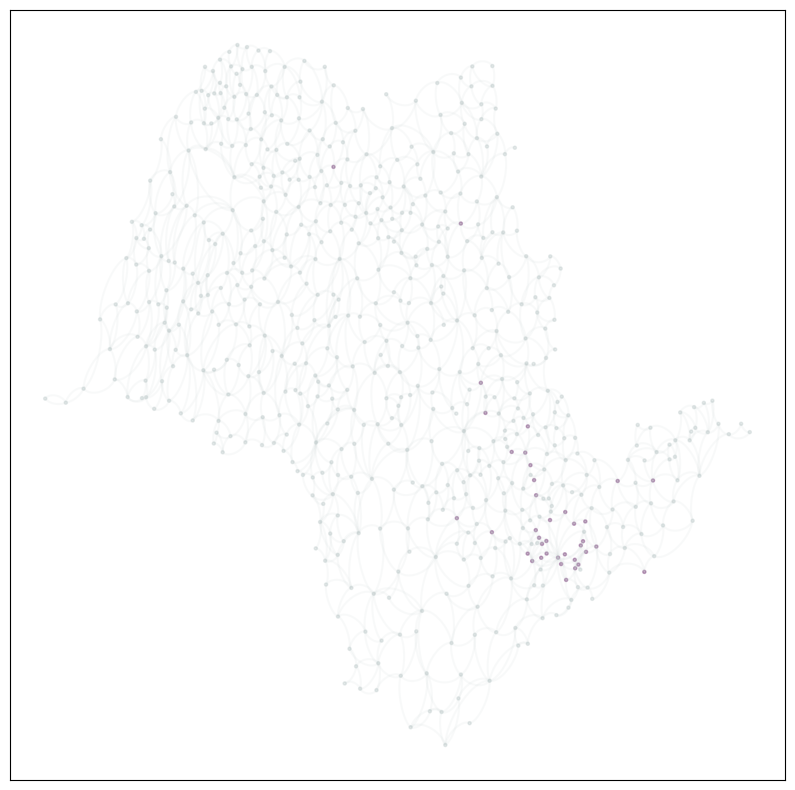

202014, 0.8478260869565217, 0.15217391304347827
-- Starting to Visualize --


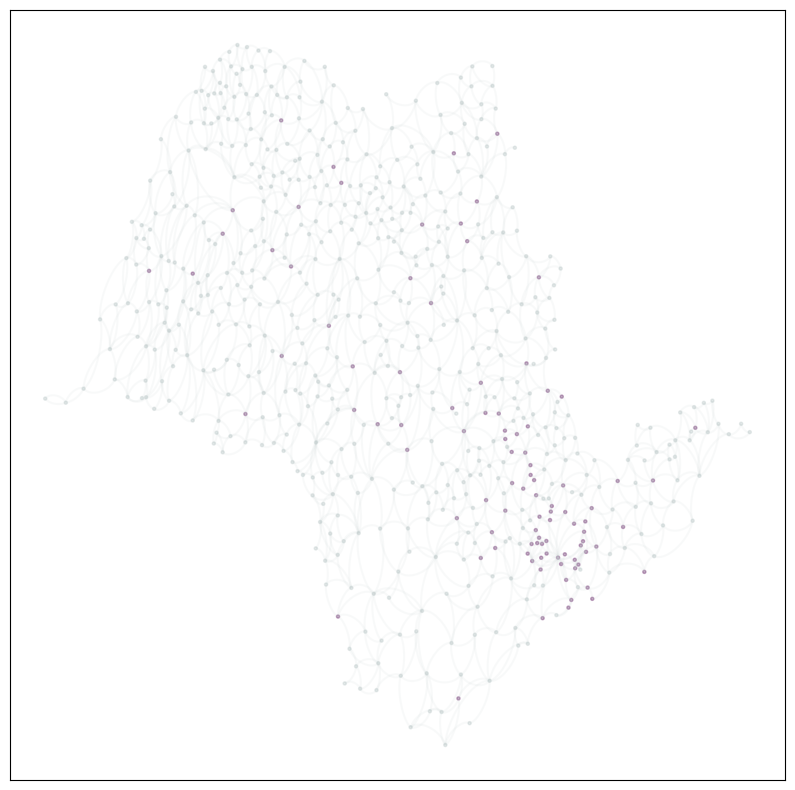

202015, 0.7484472049689441, 0.2515527950310559
-- Starting to Visualize --


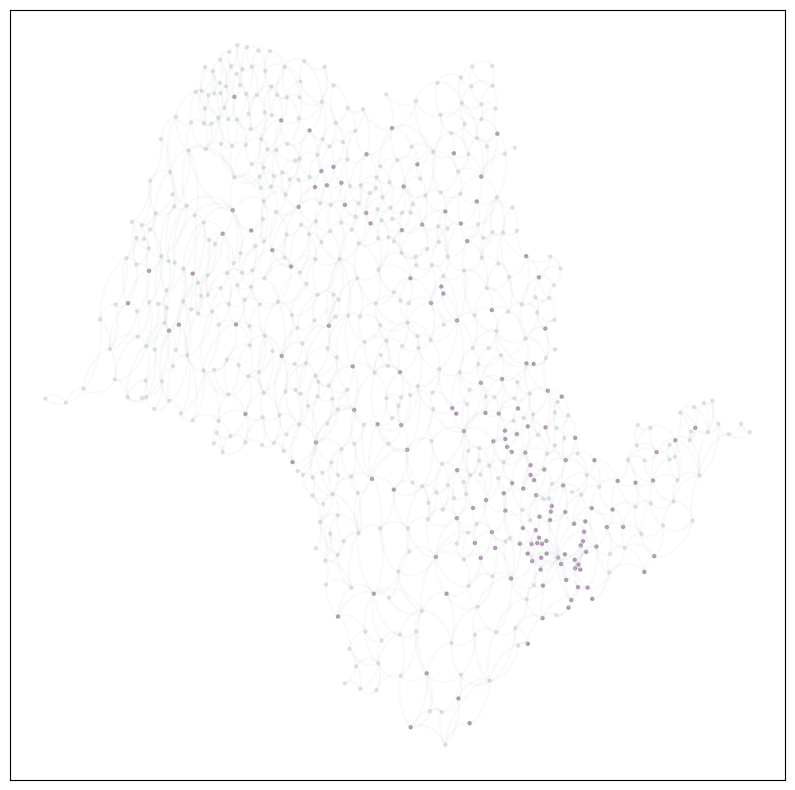

202016, 0.6490683229813664, 0.35093167701863354
-- Starting to Visualize --


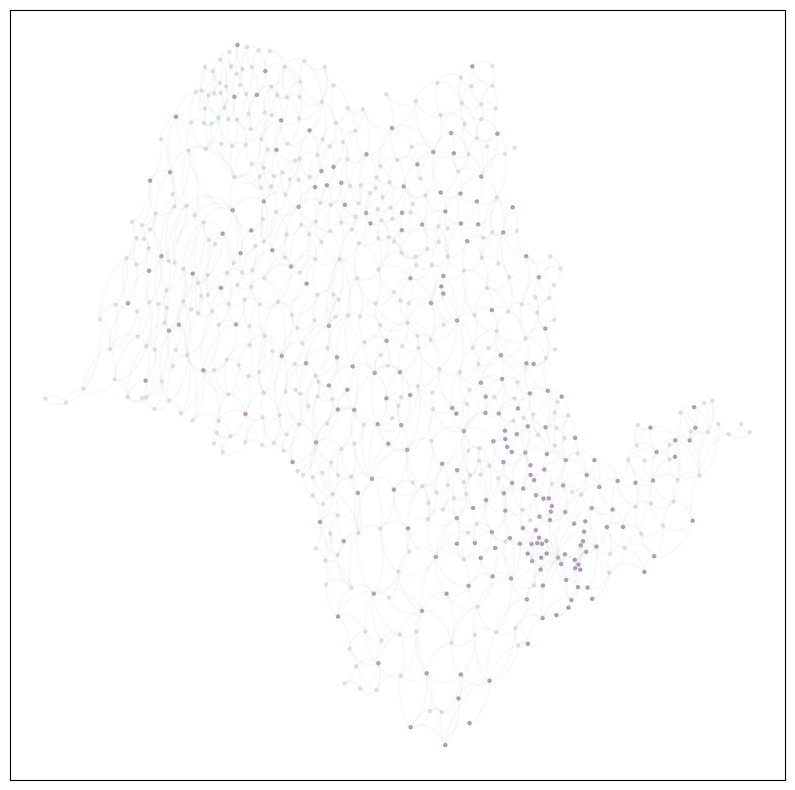

202017, 0.5590062111801242, 0.4409937888198758
-- Starting to Visualize --


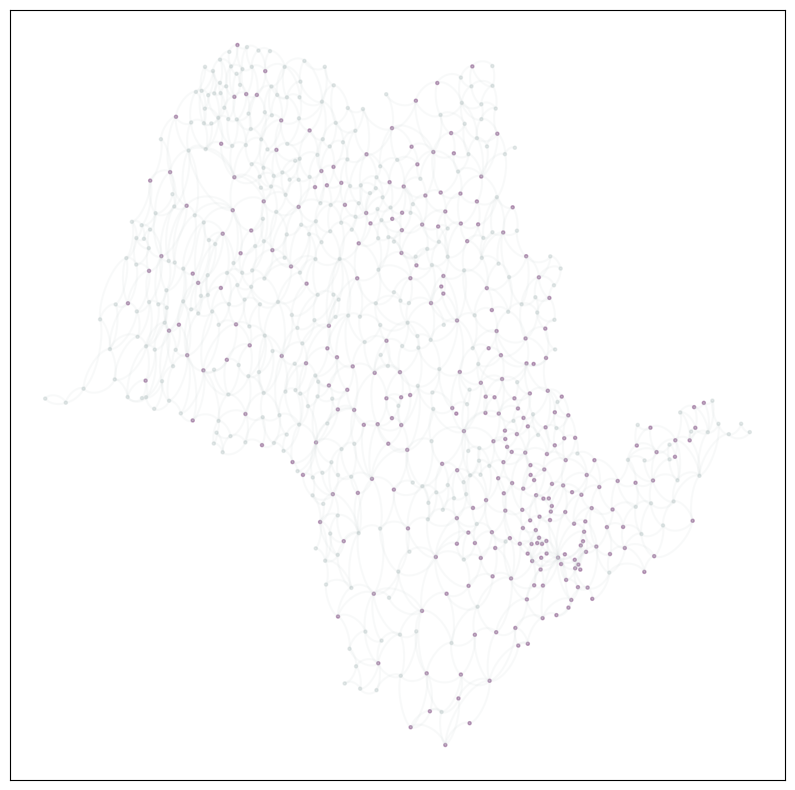

202018, 0.4798136645962733, 0.5201863354037267
-- Starting to Visualize --


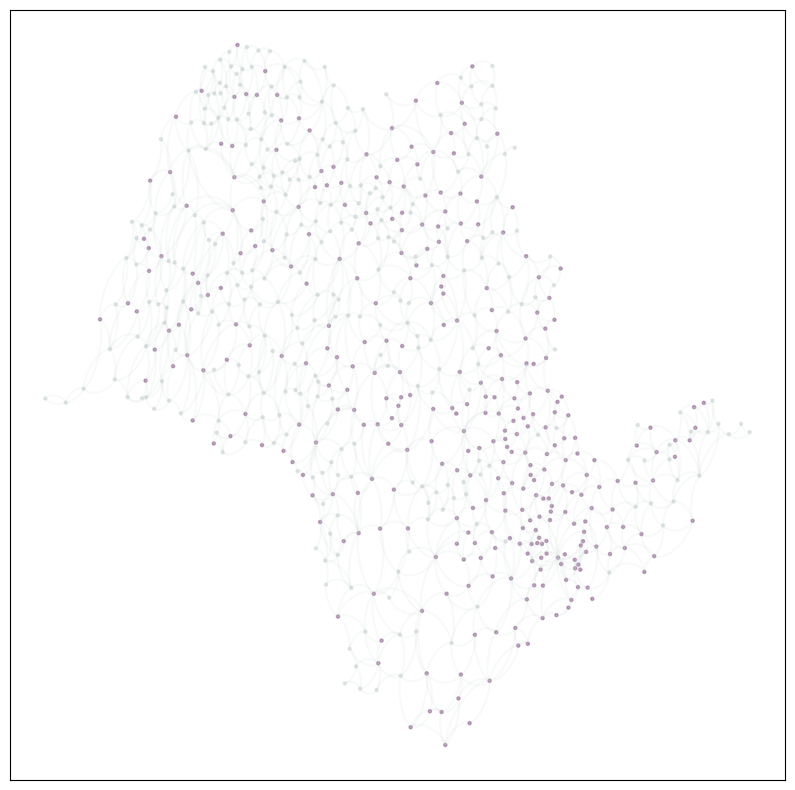

202019, 0.36024844720496896, 0.639751552795031
-- Starting to Visualize --


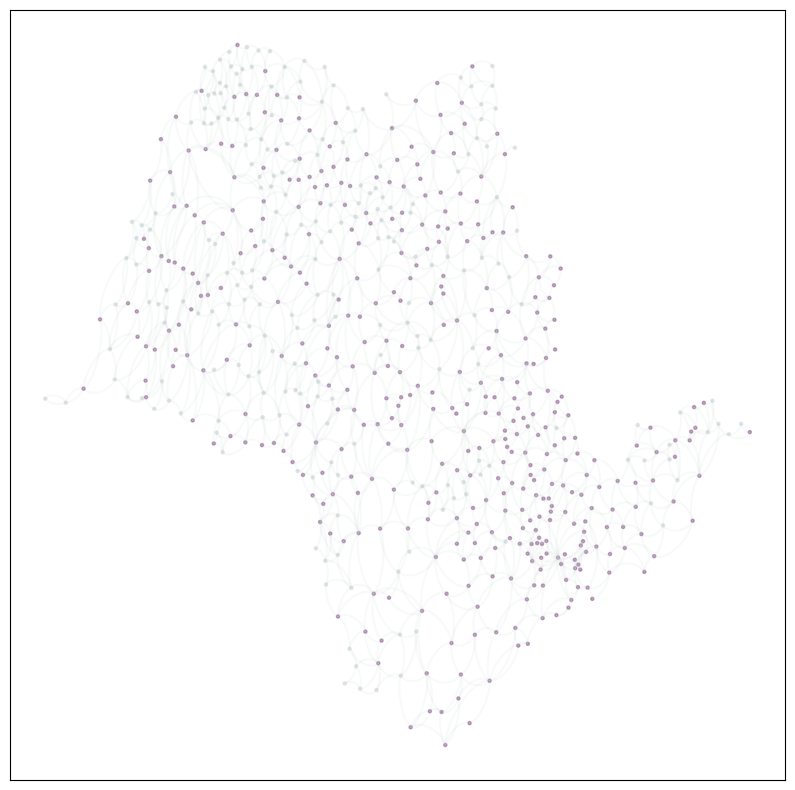

202020, 0.2748447204968944, 0.7251552795031055
-- Starting to Visualize --


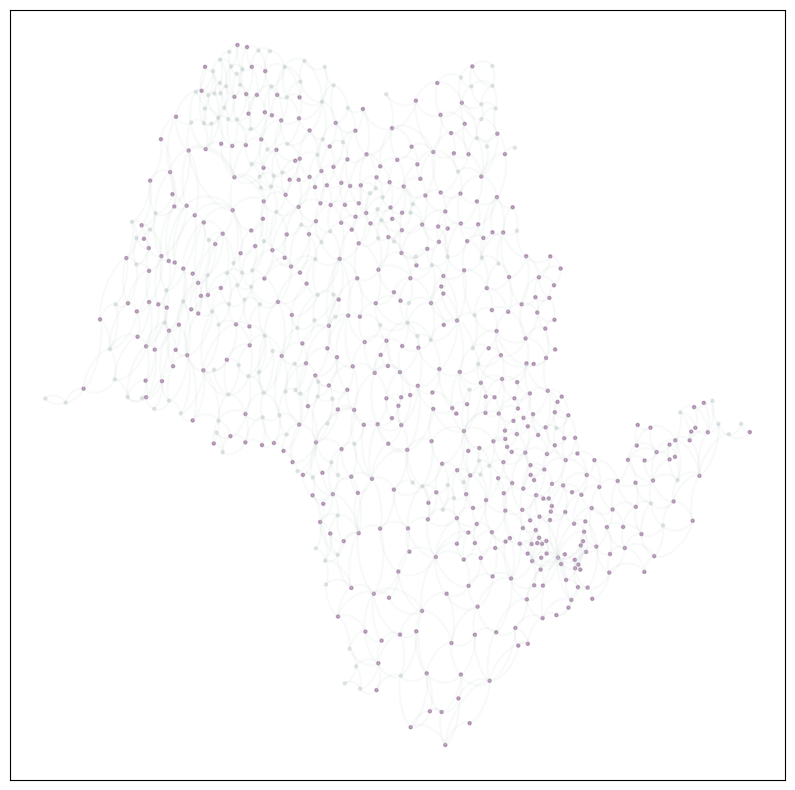

202021, 0.20031055900621117, 0.7996894409937888
-- Starting to Visualize --


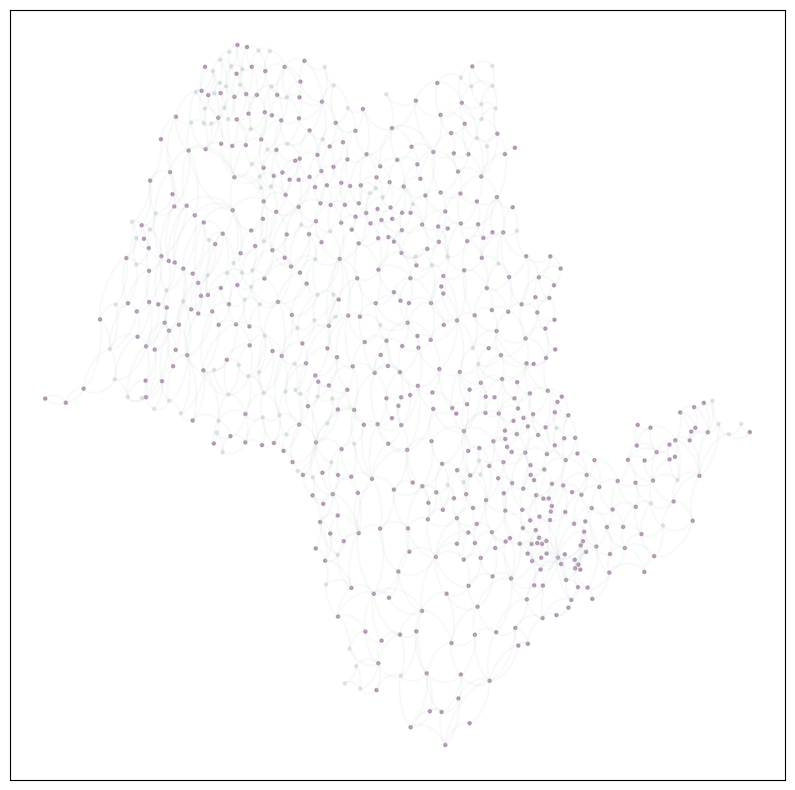

202022, 0.16614906832298137, 0.8338509316770186
-- Starting to Visualize --


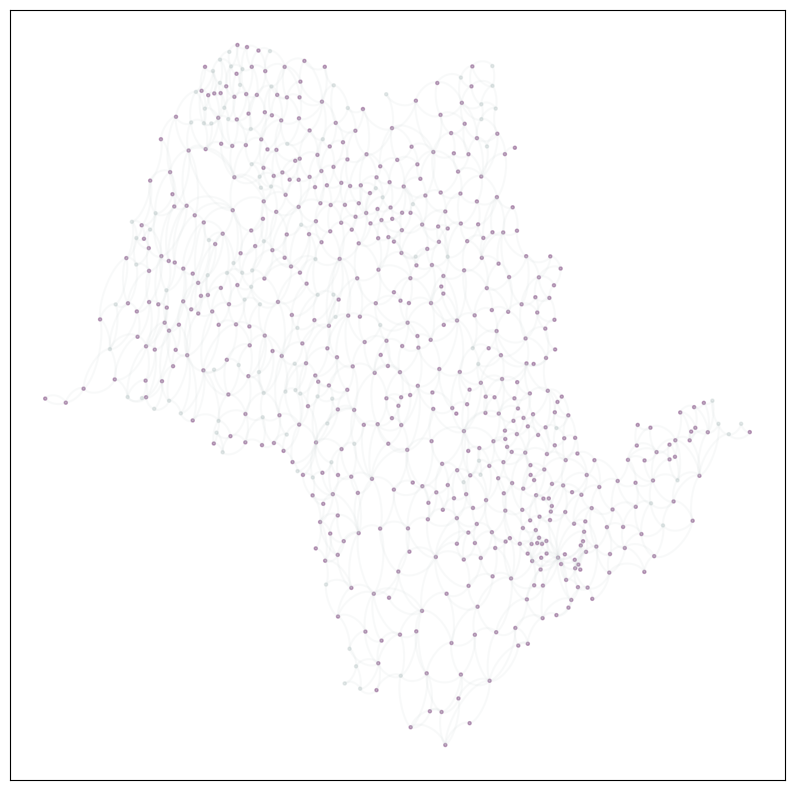

202023, 0.12267080745341614, 0.8773291925465838
-- Starting to Visualize --


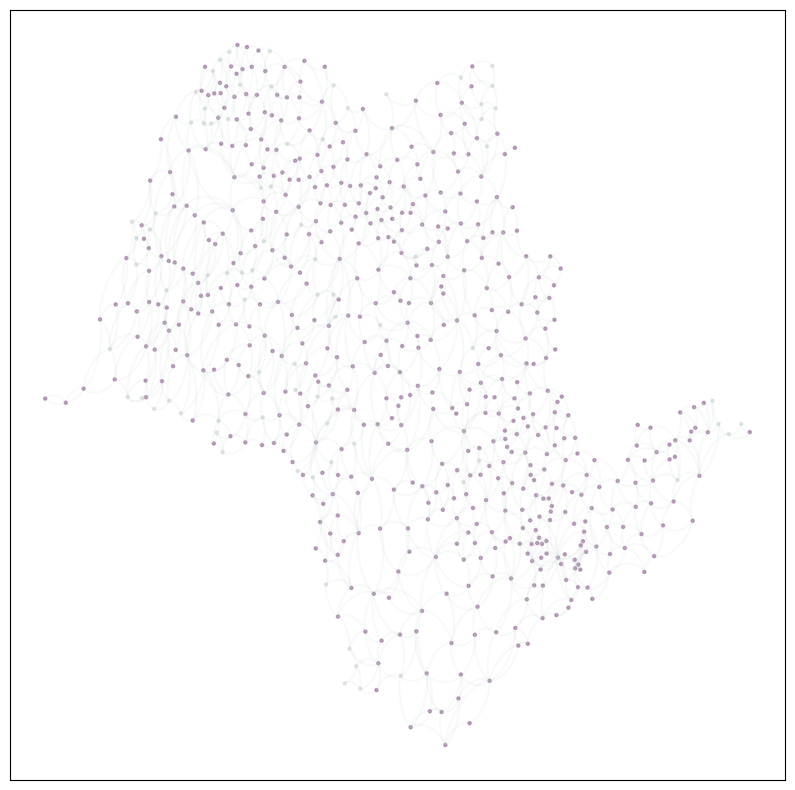

202024, 0.08850931677018634, 0.9114906832298136
-- Starting to Visualize --


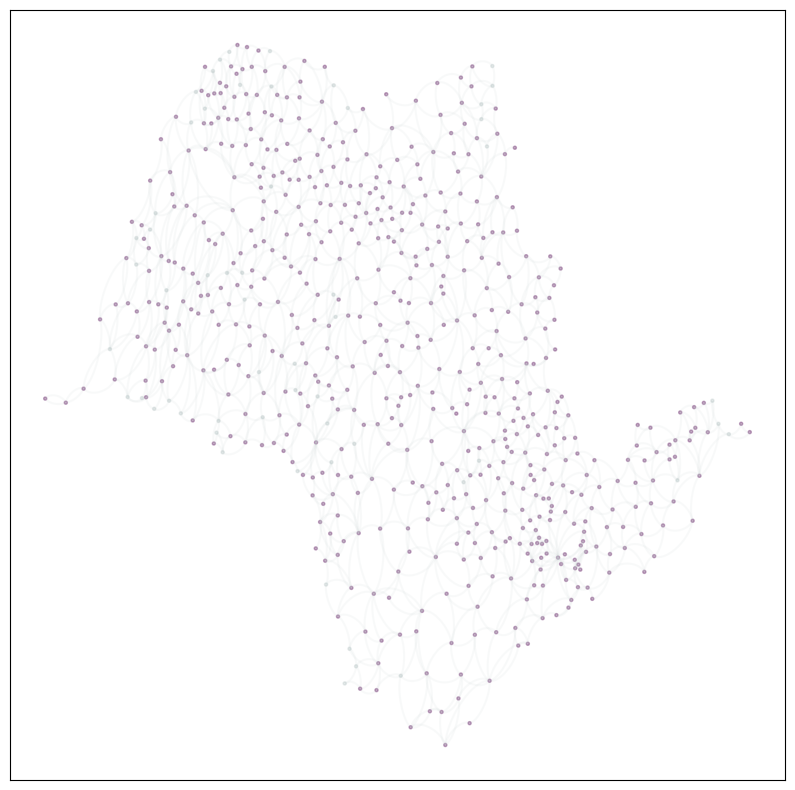

202025, 0.05745341614906832, 0.9425465838509317
-- Starting to Visualize --


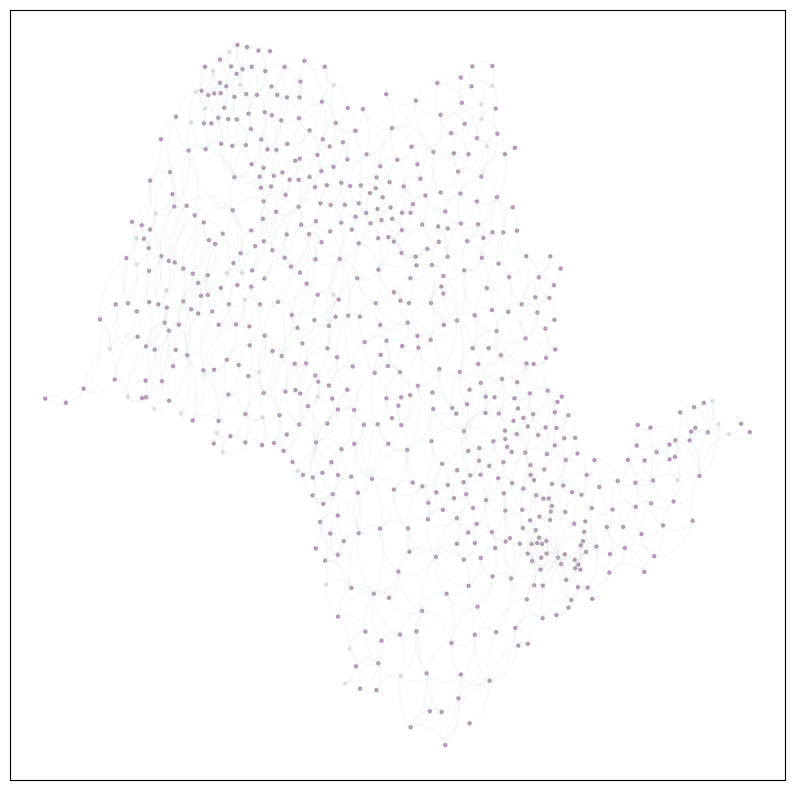

202026, 0.03571428571428571, 0.9642857142857143
-- Starting to Visualize --


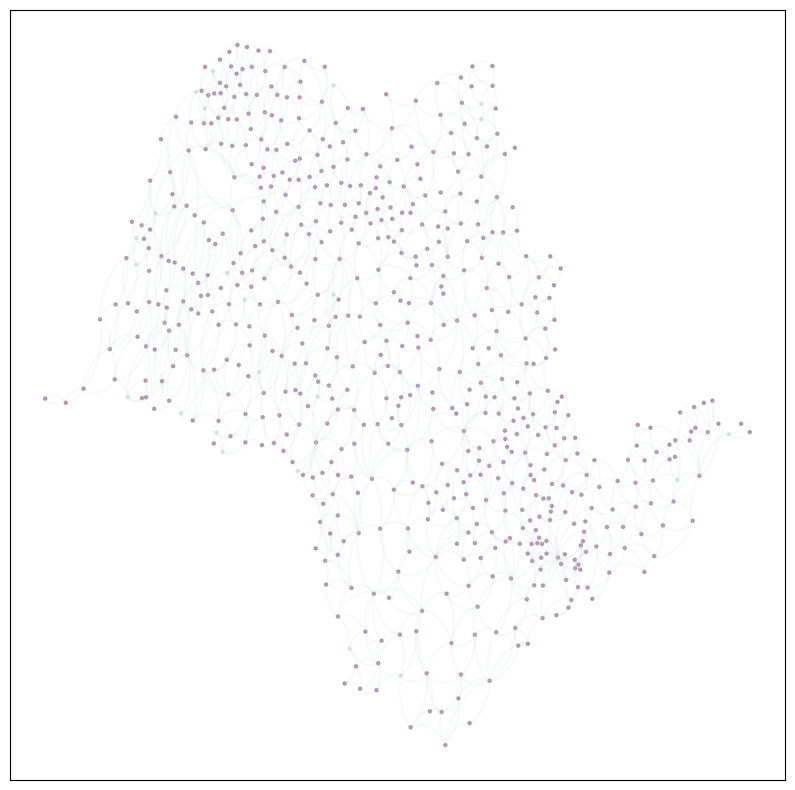

202027, 0.023291925465838508, 0.9767080745341615
-- Starting to Visualize --


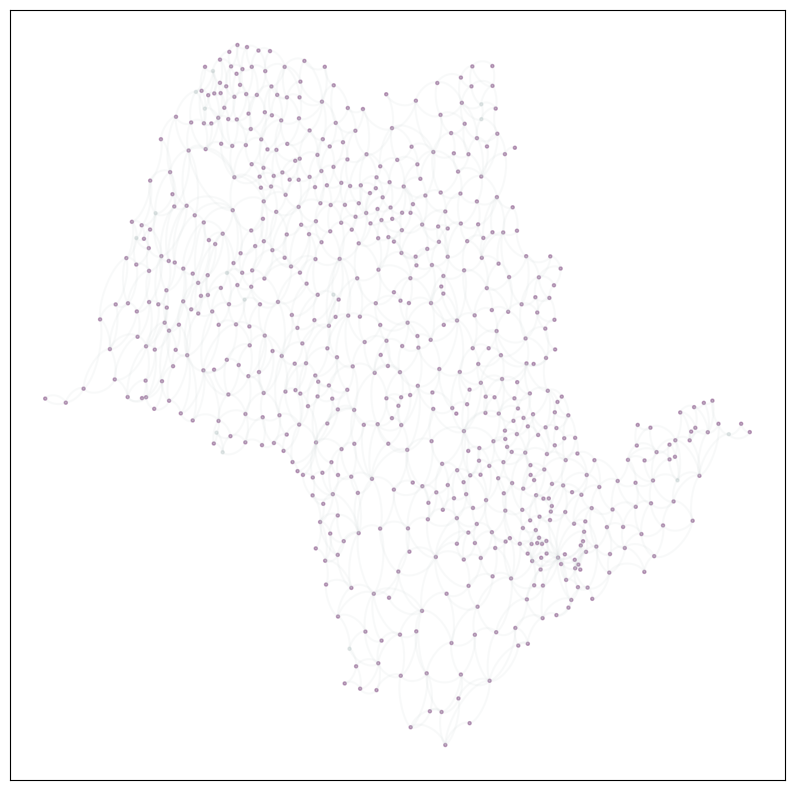

202028, 0.017080745341614908, 0.9829192546583851
-- Starting to Visualize --


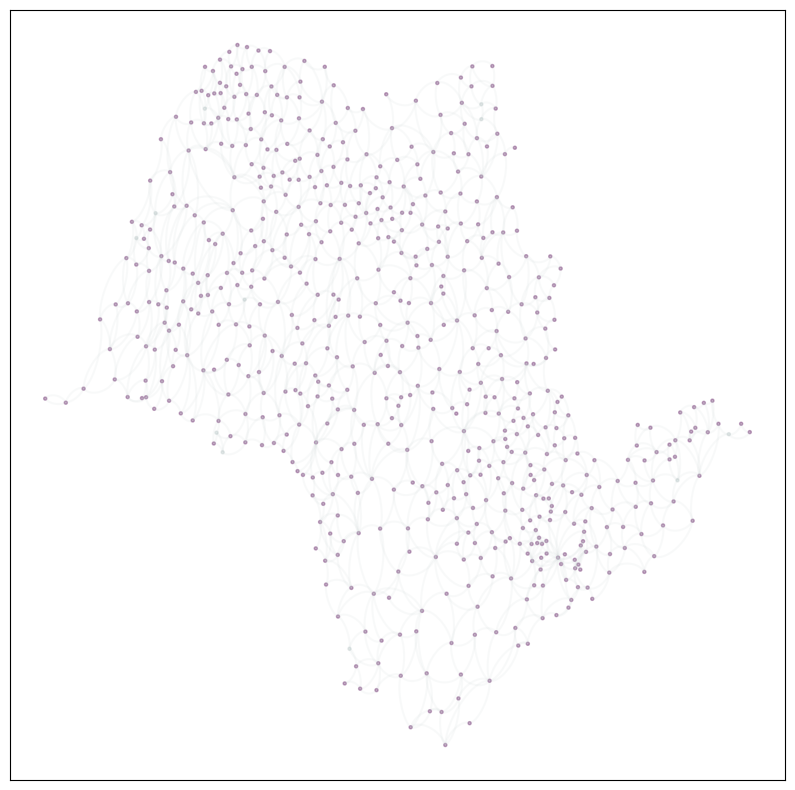

202029, 0.010869565217391304, 0.9891304347826086
-- Starting to Visualize --


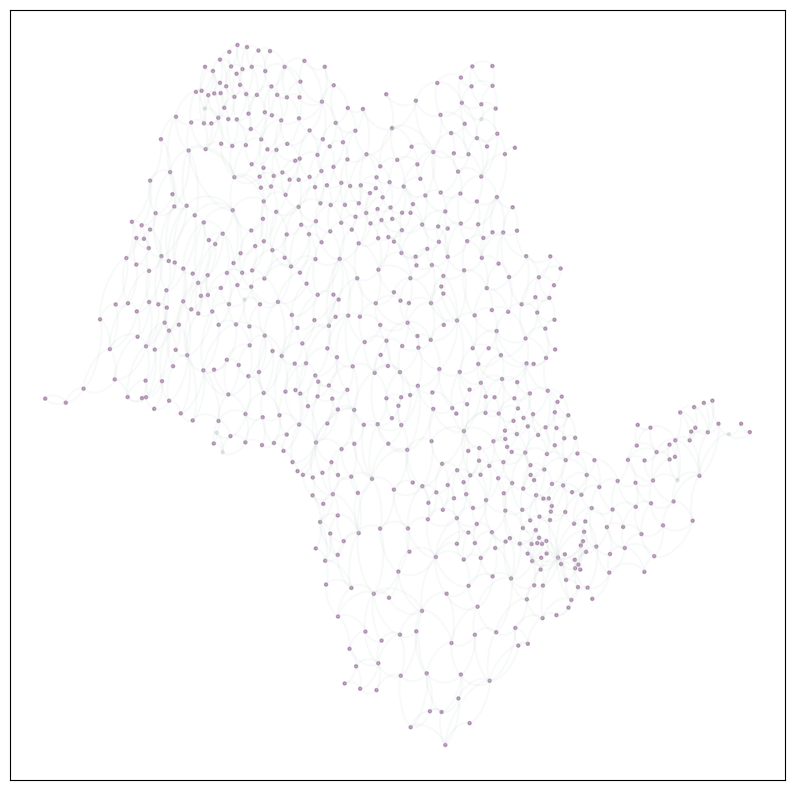

202030, 0.007763975155279503, 0.9922360248447205
-- Starting to Visualize --


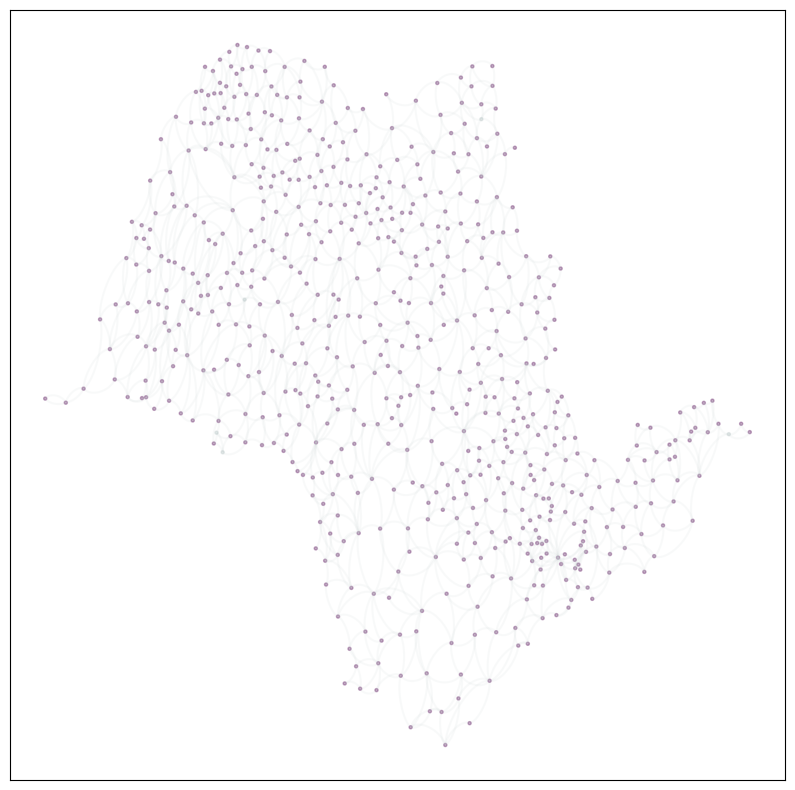

202031, 0.004658385093167702, 0.9953416149068323
-- Starting to Visualize --


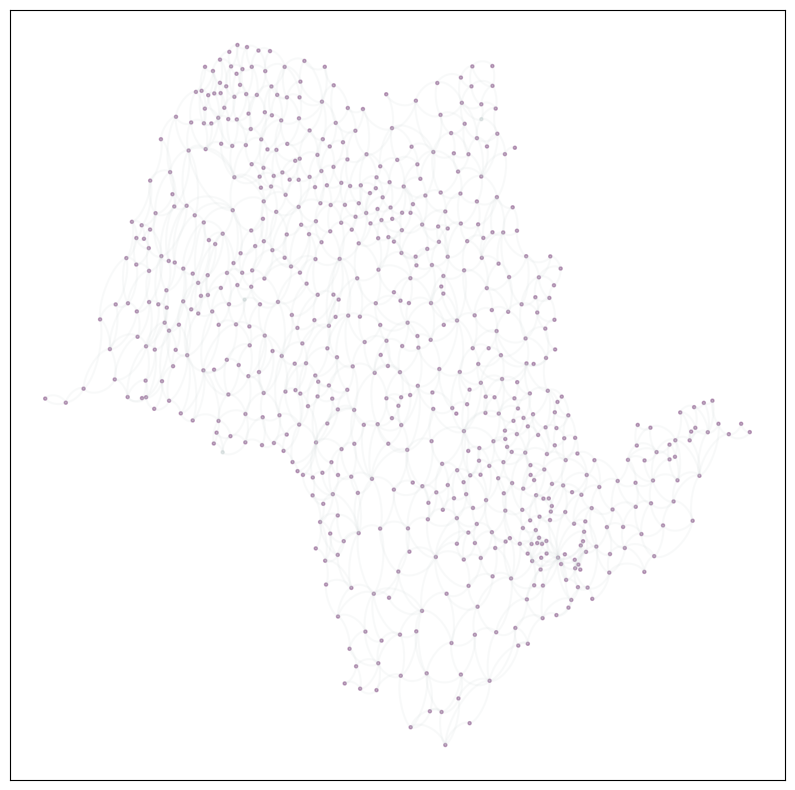

202032, 0.003105590062111801, 0.9968944099378882
-- Starting to Visualize --


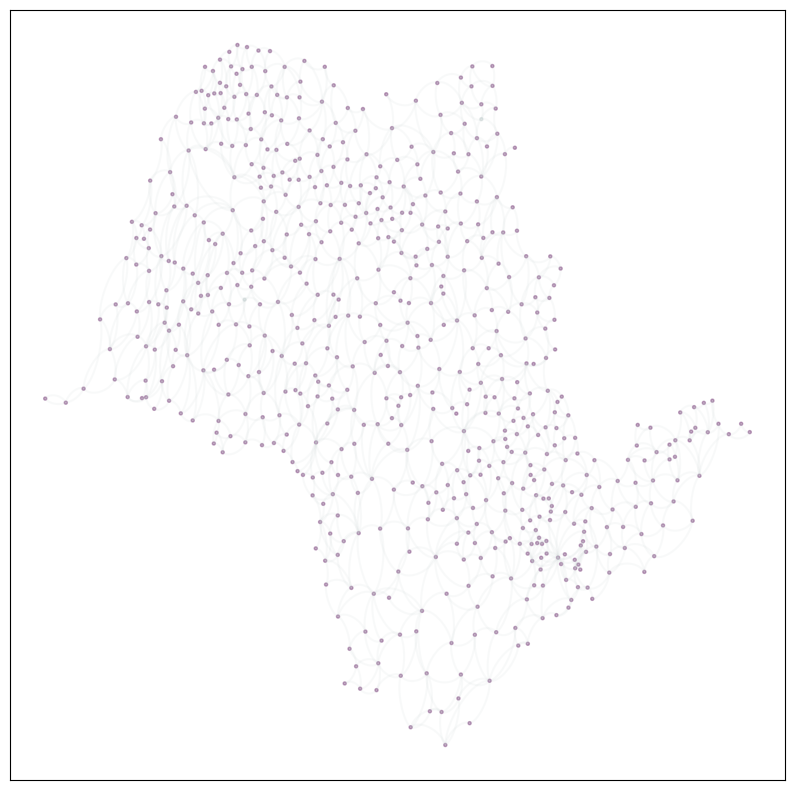

202033, 0.0015527950310559005, 0.9984472049689441
-- Starting to Visualize --


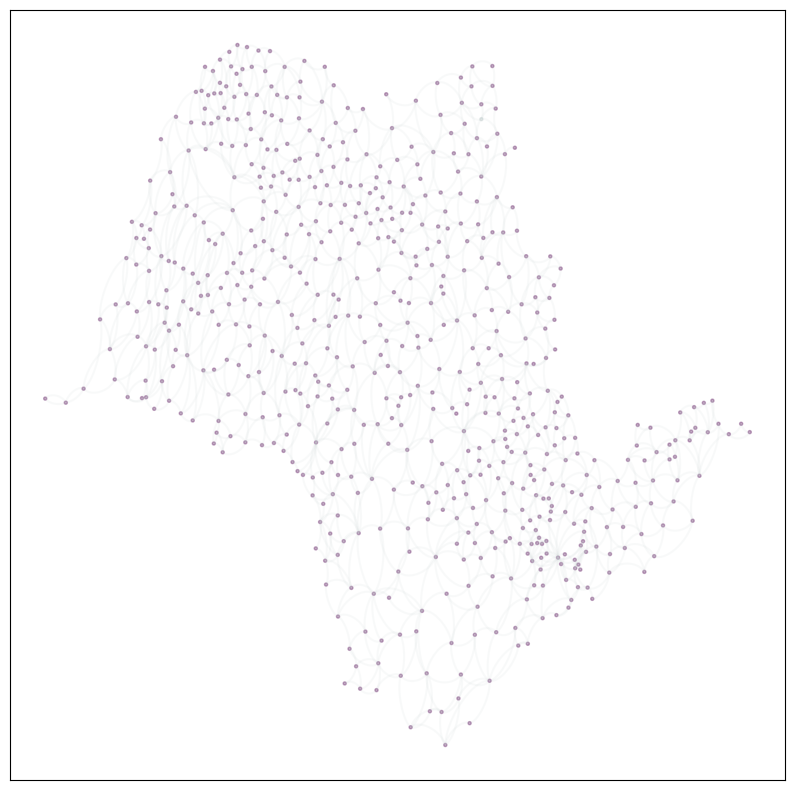

202034, 0.0, 1.0
	----------
	S: 0, I: 644, 1.0


{'Suscceptable': 0, 'Infected': 644}

In [22]:
G = create_network("grafo_cidades.gexf")
G.remove_edges_from(nx.selfloop_edges(G))
selected_nodes = [n for n, v in G.nodes(data=True) if n[-3:-1] == "SP"]
G_sub = G.subgraph(selected_nodes)
infection_yes_no(
    G_sub,
    grouped_by_city[grouped_by_city.state == "SP"],
    vis=True,
    title="title",
)

In [23]:
infection_cases(
    G_sub,
    grouped_by_city[grouped_by_city.state == "SP"],
    vis=True,
    title="title",
    DELAY=0,
)

Replicating infection.


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:1                                                                                    │
│                                                                                                  │
│ ❱ 1 infection_cases(                                                                             │
│   2 │   G_sub,                                                                                   │
│   3 │   grouped_by_city[grouped_by_city.state == "SP"],                                          │
│   4 │   vis=True,                                                                                │
│                                                                                                  │
│ /Users/giovanna_cavali/gcavali-repo/network.py:346 in infection_cases                            │
│                                                                                                  │
│   343 │                                                                                          │
│   344 │   network = input_network.copy()                                                         │
│   345 │   positions = nx.get_node_attributes(network, "pos")                                     │
│ ❱ 346 │   curves = curved_edges(network, positions)                                              │
│   347 │                                                                                          │
│   348 │   # Set the default to susceptable                                                       │
│   349 │   sys.stdout.flush()                                                                     │
│                                                                                                  │
│ /Users/giovanna_cavali/gcavali-repo/network.py:207 in curved_edges                               │
│                                                                                                  │
│   204 │   for i in range(l):                                                                     │
│   205 │   │   nodes = node_matrix[:, i, :].T                                                     │
│   206 │   │   curveplots.append(                                                                 │
│ ❱ 207 │   │   │   bezier.Curve(nodes, degree=2)                                                  │
│   208 │   │   │   .evaluate_multi(np.linspace(0, 1, bezier_precision))                           │
│   209 │   │   │   .T                                                                             │
│   210 │   │   )                                                                                  │
│                                                                                                  │
│ /Users/giovanna_cavali/opt/anaconda3/envs/c1w_rb/lib/python3.8/site-packages/bezier/curve.py:101 │
│ in __init__                                                                                      │
│                                                                                                  │
│    98 │   def __init__(self, nodes, degree, *, copy=True, verify=True):                          │
│    99 │   │   super().__init__(nodes, copy=copy)                                                 │
│   100 │   │   self._degree = degree                                                              │
│ ❱ 101 │   │   self._verify_degree(verify)                                                        │
│   102 │                                                                                          │
│   103 │   @classmethod                                                                           │
│   104 │   def from_nodes(cls, nodes, copy=True):                                                 │
│                                                                                                  │
│ /Users/giovanna_cavali/opt/anaconda3/envs/c1w_rb/lib/python